Імпортуємо потрібні бібліотеки

In [ ]:
%matplotlib inline
import pandas as pd
import numpy as np
import json
import requests
import zipfile
import os
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport

Завантажуємо файли за 2025 та 2013 роки за посиланням:  

https://data.gov.ua/dataset/0ffd8b75-0628-48cc-952a-9302f9799ec0/resource/3f13166f-090b-499e-8e23-e9851c5a5f67/download/reestrtz2025.zip  
    - reestrtz31.08.2025.csv  
Прописую в bash команду, щоб подивитися роздільник в файлі з даними:  
Bash:  
 head -n 2 reestrtz31.08.2025.csv  
"PERSON";"REG_ADDR_KOATUU";"OPER_CODE";"OPER_NAME";"D_REG";"DEP_CODE";"DEP";"BRAND";"MODEL";"VIN";"MAKE_YEAR";"COLOR";"KIND";"BODY";"PURPOSE";"FUEL";"CAPACITY";"OWN_WEIGHT";"TOTAL_WEIGHT";"N_REG_NEW"
"P";"6310138200";"254";"НАЛЕЖНИЙ КОРИСТУВАЧ. РЕЄСТРАЦІЯ";01.01.25;10000;"OLD_ДДАІ МВС УКРАЇНИ";"LEXUS";"IS 250";"JTHCK262882026114";2008;"ЧЕРВОНИЙ";"ЛЕГКОВИЙ";"СЕДАН";"ЗАГАЛЬНИЙ";"БЕНЗИН";2499;2075;2575;"АХ1312КК"  

https://data.gov.ua/dataset/0ffd8b75-0628-48cc-952a-9302f9799ec0/resource/86a9548b-8323-4fa2-972e-0692edf6959f/download/tz_opendata_z01012013_po31122013.zip  
    - tz_opendata_z01012013_po31122013.csv  
Bash:  
head -n 2 tz_opendata_z01012013_po31122013.csv  
person;reg_addr_koatuu;oper_code;oper_name;d_reg;dep_code;dep;brand;model;make_year;color;kind;body;purpose;fuel;capacity;own_weight;total_weight;n_reg_new
P;0510137000;40;"40 - ВТОРИННА РЕЄСТРАЦІЯ ТЗ, ПРИДБАНОГО В ТОРГОВЕЛЬНІЙ ОРГАНІЗАЦІЇ";2013-01-16;1305301;"ВІННИЦЬКИЙ  ВРЕР УДАІ УМВС УКРАЇНИ У ВІННИЦЬКІЙ ОБЛАСТІ";"SSANG YONG  REXTON";REXTON;2007;ЧОРНИЙ;ЛЕГКОВИЙ;УНІВЕРСАЛ-B;ЗАГАЛЬНИЙ;"ДИЗЕЛЬНЕ ПАЛИВО";2696;2069;2550;АВ1923ВТ  


Створюєм датафрейми з даних у файлі і дивимось вміст

In [2]:
df2013 = pd.read_csv('tz_opendata_z01012013_po31122013.csv', sep=';', low_memory=False, encoding='utf-8')

In [7]:
df2013.head(4)

,person,reg_addr_koatuu,oper_code,oper_name,d_reg,dep_code,dep,brand,model,make_year,color,kind,body,purpose,fuel,capacity,own_weight,total_weight,n_reg_new
0,P,5.101370e+08,40,"40 - ВТОРИННА РЕЄСТРАЦІЯ ТЗ, ПРИДБАНОГО В ТОРГ...",2013-01-16,1305301,ВІННИЦЬКИЙ ВРЕР УДАІ УМВС УКРАЇНИ У ВІННИЦЬКІ...,SSANG YONG REXTON,REXTON,2007,ЧОРНИЙ,ЛЕГКОВИЙ,УНІВЕРСАЛ-B,ЗАГАЛЬНИЙ,ДИЗЕЛЬНЕ ПАЛИВО,2696.0,2069.0,2550.0,АВ1923ВТ
1,P,5.110137e+09,230,230 - ВИДАЧА СВ. ПРО РЕЄСТР ДЛЯ ПОЇЗДКИ ЗА КО...,2013-08-29,5146,Центр 5146,TOYOTA PREVIA,PREVIA,2007,СІРИЙ,ЛЕГКОВИЙ,УНІВЕРСАЛ-B,ЗАГАЛЬНИЙ,БЕНЗИН,2362.0,1720.0,2450.0,ВН8542СО
2,P,2.310137e+09,40,"40 - ВТОРИННА РЕЄСТРАЦІЯ ТЗ, ПРИДБАНОГО В ТОРГ...",2013-02-02,1242,Центр 1242,SKODA OCTAVIA,OCTAVIA,2011,БІЛИЙ,ЛЕГКОВИЙ,ХЕТЧБЕК-В,ЗАГАЛЬНИЙ,БЕНЗИН,1595.0,1245.0,1720.0,АР6199СІ
3,P,6.110100e+09,400,400 - ПЕРЕРЕЄСТРАЦIЯ ПРИ ПЕРЕОБЛАДНАННI БЕЗ ЗА...,2013-01-26,6141,Центр 6141,CITROEN JUMPY,JUMPY,2008,БІЛИЙ,ЛЕГКОВИЙ,ПАСАЖИРСЬКИЙ-B,ЗАГАЛЬНИЙ,ДИЗЕЛЬНЕ ПАЛИВО,1560.0,1736.0,2661.0,ВО5930ВА


In [3]:
df2025 = pd.read_csv('reestrtz31.08.2025.csv', sep=';', low_memory=False, encoding='utf-8')


In [24]:
df2025.head(4)

,PERSON,REG_ADDR_KOATUU,OPER_CODE,OPER_NAME,D_REG,DEP_CODE,DEP,BRAND,MODEL,VIN,MAKE_YEAR,COLOR,KIND,BODY,PURPOSE,FUEL,CAPACITY,OWN_WEIGHT,TOTAL_WEIGHT,N_REG_NEW
0,P,6.310138e+09,254,НАЛЕЖНИЙ КОРИСТУВАЧ. РЕЄСТРАЦІЯ,01.01.25,10000,OLD_ДДАІ МВС УКРАЇНИ,LEXUS,IS 250,JTHCK262882026114,2008,ЧЕРВОНИЙ,ЛЕГКОВИЙ,СЕДАН,ЗАГАЛЬНИЙ,БЕНЗИН,2499.0,2075,2575,АХ1312КК
1,P,3.222486e+09,254,НАЛЕЖНИЙ КОРИСТУВАЧ. РЕЄСТРАЦІЯ,01.01.25,10000,OLD_ДДАІ МВС УКРАЇНИ,MG,350,LSJA16E34EG012544,2014,ЧОРНИЙ,ЛЕГКОВИЙ,СЕДАН,ЗАГАЛЬНИЙ,БЕНЗИН,1498.0,1265,1640,АІ9214СІ
2,P,3.521486e+09,254,НАЛЕЖНИЙ КОРИСТУВАЧ. РЕЄСТРАЦІЯ,01.01.25,10000,OLD_ДДАІ МВС УКРАЇНИ,SKODA,SUPERB,TMBCR63U789012741,2007,ЧОРНИЙ,ЛЕГКОВИЙ,СЕДАН,ЗАГАЛЬНИЙ,ДИЗЕЛЬНЕ ПАЛИВО,1968.0,1593,2103,АХ1298ОА
3,P,8.000000e+09,254,НАЛЕЖНИЙ КОРИСТУВАЧ. РЕЄСТРАЦІЯ,01.01.25,10000,OLD_ДДАІ МВС УКРАЇНИ,TOYOTA,RAV-4 HYBRID,JTMW23FVX0D106165,2021,БІЛИЙ,ЛЕГКОВИЙ,УНІВЕРСАЛ,ЗАГАЛЬНИЙ,ЕЛЕКТРО АБО БЕНЗИН,2487.0,1755,2135,КА5010НС


Запускаємо ydata_profiling

In [4]:
profile2013 = ProfileReport(df2013, title="Profiling Report")
profile2013

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 19/19 [04:02<00:00, 12.78s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
profile2025 = ProfileReport(df2025, title="Profiling Report")
profile2025

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 20/20 [03:14<00:00,  9.75s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Коригуємо назви колонок

In [9]:
df2013.columns = df2013.columns.str.upper()
df2013.head(4)

,PERSON,REG_ADDR_KOATUU,OPER_CODE,OPER_NAME,D_REG,DEP_CODE,DEP,BRAND,MODEL,MAKE_YEAR,COLOR,KIND,BODY,PURPOSE,FUEL,CAPACITY,OWN_WEIGHT,TOTAL_WEIGHT,N_REG_NEW
0,P,5.101370e+08,40,"40 - ВТОРИННА РЕЄСТРАЦІЯ ТЗ, ПРИДБАНОГО В ТОРГ...",2013-01-16,1305301,ВІННИЦЬКИЙ ВРЕР УДАІ УМВС УКРАЇНИ У ВІННИЦЬКІ...,SSANG YONG REXTON,REXTON,2007,ЧОРНИЙ,ЛЕГКОВИЙ,УНІВЕРСАЛ-B,ЗАГАЛЬНИЙ,ДИЗЕЛЬНЕ ПАЛИВО,2696.0,2069.0,2550.0,АВ1923ВТ
1,P,5.110137e+09,230,230 - ВИДАЧА СВ. ПРО РЕЄСТР ДЛЯ ПОЇЗДКИ ЗА КО...,2013-08-29,5146,Центр 5146,TOYOTA PREVIA,PREVIA,2007,СІРИЙ,ЛЕГКОВИЙ,УНІВЕРСАЛ-B,ЗАГАЛЬНИЙ,БЕНЗИН,2362.0,1720.0,2450.0,ВН8542СО
2,P,2.310137e+09,40,"40 - ВТОРИННА РЕЄСТРАЦІЯ ТЗ, ПРИДБАНОГО В ТОРГ...",2013-02-02,1242,Центр 1242,SKODA OCTAVIA,OCTAVIA,2011,БІЛИЙ,ЛЕГКОВИЙ,ХЕТЧБЕК-В,ЗАГАЛЬНИЙ,БЕНЗИН,1595.0,1245.0,1720.0,АР6199СІ
3,P,6.110100e+09,400,400 - ПЕРЕРЕЄСТРАЦIЯ ПРИ ПЕРЕОБЛАДНАННI БЕЗ ЗА...,2013-01-26,6141,Центр 6141,CITROEN JUMPY,JUMPY,2008,БІЛИЙ,ЛЕГКОВИЙ,ПАСАЖИРСЬКИЙ-B,ЗАГАЛЬНИЙ,ДИЗЕЛЬНЕ ПАЛИВО,1560.0,1736.0,2661.0,ВО5930ВА


Дивлюсь всю інформацію про дані

In [9]:
df2025.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458706 entries, 0 to 1458705
Data columns (total 20 columns):
 #   Column           Non-Null Count    Dtype  
---  ------           --------------    -----  
 0   PERSON           1458706 non-null  object 
 1   REG_ADDR_KOATUU  1458704 non-null  float64
 2   OPER_CODE        1458706 non-null  int64  
 3   OPER_NAME        1458706 non-null  object 
 4   D_REG            1458706 non-null  object 
 5   DEP_CODE         1458706 non-null  int64  
 6   DEP              1458706 non-null  object 
 7   BRAND            1458706 non-null  object 
 8   MODEL            1458706 non-null  object 
 9   VIN              1458604 non-null  object 
 10  MAKE_YEAR        1458706 non-null  int64  
 11  COLOR            1458706 non-null  object 
 12  KIND             1458706 non-null  object 
 13  BODY             1458706 non-null  object 
 14  PURPOSE          1458706 non-null  object 
 15  FUEL             1409712 non-null  object 
 16  CAPACITY         1

In [10]:
df2013.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1935496 entries, 0 to 1935495
Data columns (total 19 columns):
 #   Column           Dtype  
---  ------           -----  
 0   PERSON           object 
 1   REG_ADDR_KOATUU  float64
 2   OPER_CODE        int64  
 3   OPER_NAME        object 
 4   D_REG            object 
 5   DEP_CODE         int64  
 6   DEP              object 
 7   BRAND            object 
 8   MODEL            object 
 9   MAKE_YEAR        int64  
 10  COLOR            object 
 11  KIND             object 
 12  BODY             object 
 13  PURPOSE          object 
 14  FUEL             object 
 15  CAPACITY         float64
 16  OWN_WEIGHT       float64
 17  TOTAL_WEIGHT     float64
 18  N_REG_NEW        object 
dtypes: float64(4), int64(3), object(12)
memory usage: 280.6+ MB


Фільтруєм та об'єднуєм дані  

In [13]:
df_list = [df2013, df2025] 

# Список для збереження відфільтрованих DataFrame'ів
combined_df_list = []

# Ітеруємося по обох списках одночасно: назви змінних і самі DataFrame'и
for df_name, df in zip(['df2013', 'df2025'], df_list):
    # Фільтруємо DataFrame за трьома умовами та вибираємо потрібні стовпці
    filtered_df = df[
        (df['PERSON'] == 'P') & 
        (df['KIND'] == 'ЛЕГКОВИЙ') & 
        (df['PURPOSE'] == 'ЗАГАЛЬНИЙ')
    ][['PERSON', 'OPER_CODE', 'OPER_NAME', 'D_REG', 'BRAND', 'MODEL', 'MAKE_YEAR', 'COLOR', 
       'KIND', 'BODY', 'PURPOSE', 'FUEL']]
    
    # Витягуємо рік з назви змінної.
    # Наприклад, 'df2013' -> '2013'
    year = int(''.join(filter(str.isdigit, df_name)))
    
    # Додаємо нову колонку 'YEAR' до відфільтрованого DataFrame
    filtered_df['YEAR'] = year
    
    # Додаємо відфільтрований DataFrame до нового списку
    combined_df_list.append(filtered_df)

# Об'єднуємо всі відфільтровані DataFrame'и в один
final_df = pd.concat(combined_df_list, ignore_index=True)

print("Фінальний об'єднаний та відфільтрований DataFrame:")
print(final_df)

Фінальний об'єднаний та відфільтрований DataFrame:
        PERSON  OPER_CODE                                          OPER_NAME  \
0            P         40  40 - ВТОРИННА РЕЄСТРАЦІЯ ТЗ, ПРИДБАНОГО В ТОРГ...   
1            P        230  230 -  ВИДАЧА СВ. ПРО РЕЄСТР ДЛЯ ПОЇЗДКИ ЗА КО...   
2            P         40  40 - ВТОРИННА РЕЄСТРАЦІЯ ТЗ, ПРИДБАНОГО В ТОРГ...   
3            P        400  400 - ПЕРЕРЕЄСТРАЦIЯ ПРИ ПЕРЕОБЛАДНАННI БЕЗ ЗА...   
4            P        400  400 - ПЕРЕРЕЄСТРАЦIЯ ПРИ ПЕРЕОБЛАДНАННI БЕЗ ЗА...   
...        ...        ...                                                ...   
2444021      P         70  РЕЄСТРАЦIЯ Б/В ТЗ ПРИВЕЗЕНОГО З-ЗА КОРДОНУ ПО ВМД   
2444022      P         70  РЕЄСТРАЦIЯ Б/В ТЗ ПРИВЕЗЕНОГО З-ЗА КОРДОНУ ПО ВМД   
2444023      P         70  РЕЄСТРАЦIЯ Б/В ТЗ ПРИВЕЗЕНОГО З-ЗА КОРДОНУ ПО ВМД   
2444024      P         70  РЕЄСТРАЦIЯ Б/В ТЗ ПРИВЕЗЕНОГО З-ЗА КОРДОНУ ПО ВМД   
2444025      P         70  РЕЄСТРАЦIЯ Б/В ТЗ ПРИВЕЗЕНОГО З-ЗА КОРДОНУ

In [11]:
print(len(final_df))

2444026


Робим чекпоінт (копію загального датафрему)

In [14]:
df2013_2025 = final_df.copy()

Перевіряєм, які коди відповідають за первинну реєстрацію

In [15]:
df2013_2025[df2013_2025['OPER_NAME'].str.upper().str.contains('ПЕРВИННА')]['OPER_CODE'].unique()

array([ 30, 100, 105,  99], dtype=int64)

ТОП-20 НАЙПОПУЛЯРНІШИХ КОДІВ

In [16]:
df2013_2025[['OPER_CODE', 'OPER_NAME']].value_counts().head(20)

OPER_CODE  OPER_NAME                                                                                            
40         40 - ВТОРИННА РЕЄСТРАЦІЯ ТЗ, ПРИДБАНОГО В ТОРГОВЕЛЬНІЙ ОРГАНІЗАЦІЇ                                       428354
530        530 - ЗНЯТТЯ З ОБЛIКУ ДЛЯ РЕАЛIЗАЦIЇ                                                                     381895
315        ПЕРЕРЕЄСТРАЦІЯ ТЗ НА НОВ. ВЛАСН. ПО ДОГОВОРУ УКЛАДЕНОМУ В ТСЦ                                            290999
254        НАЛЕЖНИЙ КОРИСТУВАЧ. РЕЄСТРАЦІЯ                                                                          178386
308        ПЕРЕРЕЄСТРАЦІЯ НА НОВОГО ВЛАСНИКА ЗА ДОГ. КУПIВЛI-ПРОДАЖУ (СГ)                                           164205
400        400 - ПЕРЕРЕЄСТРАЦIЯ ПРИ ПЕРЕОБЛАДНАННI БЕЗ ЗАМIНИ НОМЕРНИХ АГРЕГ.                                       134957
314        ПЕРЕРЕЄСТРАЦІЯ ТЗ ІЗ УКЛАДАННЯМ ДОГОВОРУ КУПІВЛІ-ПРОДАЖУ ЧЕРЕЗ ЕЛЕКТРОННІ СЕРВІСИ ТА ЗОВНІШНІ РЕСУРСИ    122266
100        ПЕРВИННА РЕЄСТР

Фільтруєм - тільки первинна реєстрація

In [17]:
list_of_codes = [ 30, 100, 105,  99, 172, 70, 71]
filter_df = df2013_2025[df2013_2025['OPER_CODE'].isin(list_of_codes)]
filter_df.reset_index(inplace=True)

In [18]:
len(filter_df)

330587

Фільтруєм - залишаєм лише колонки, які нас цікавлять

In [56]:
firsts_df = filter_df[['D_REG','BRAND', 'MODEL', 'MAKE_YEAR','COLOR','FUEL', 'YEAR']]
firsts_df.to_csv('first_reg_2013_2025_years.csv')
firsts_df.head()

,D_REG,BRAND,MODEL,MAKE_YEAR,COLOR,FUEL,YEAR
0,2013-06-08,FIAT LINEA,LINEA,2013,СІРИЙ,БЕНЗИН АБО ГАЗ,2013
1,2013-01-19,HYUNDAI IX35,IX35,2012,СИНІЙ,БЕНЗИН,2013
2,2013-02-05,HYUNDAI ACCENT,ACCENT,2012,СІРИЙ,БЕНЗИН,2013
3,2013-01-18,ЗАЗ SENS,SENS,2012,БІЛИЙ,БЕНЗИН,2013
4,2013-08-30,GEELY EMGRAND 7,EMGRAND 7,2013,БІЛИЙ,БЕНЗИН,2013


Дивимось на відповідність типів даних

In [57]:
firsts_df.dtypes

D_REG        object
BRAND        object
MODEL        object
MAKE_YEAR     int64
COLOR        object
FUEL         object
YEAR          int64
dtype: object

In [58]:
firsts_df

,D_REG,BRAND,MODEL,MAKE_YEAR,COLOR,FUEL,YEAR
0,2013-06-08,FIAT LINEA,LINEA,2013,СІРИЙ,БЕНЗИН АБО ГАЗ,2013
1,2013-01-19,HYUNDAI IX35,IX35,2012,СИНІЙ,БЕНЗИН,2013
2,2013-02-05,HYUNDAI ACCENT,ACCENT,2012,СІРИЙ,БЕНЗИН,2013
3,2013-01-18,ЗАЗ SENS,SENS,2012,БІЛИЙ,БЕНЗИН,2013
4,2013-08-30,GEELY EMGRAND 7,EMGRAND 7,2013,БІЛИЙ,БЕНЗИН,2013
...,...,...,...,...,...,...,...
330582,30.08.25,BMW,530,2017,ЧОРНИЙ,ЕЛЕКТРО АБО БЕНЗИН,2025
330583,30.08.25,HYUNDAI,I30,2009,БІЛИЙ,БЕНЗИН,2025
330584,30.08.25,MAZDA,CX-50,2022,СІРИЙ,БЕНЗИН,2025
330585,30.08.25,TESLA,MODEL Y,2023,БІЛИЙ,ЕЛЕКТРО,2025


Коригуємо дати

In [59]:
def convert_date(date_str):
    if '.' in date_str:
        # Якщо в даті є крапка, використовуємо формат дд.мм.рр
        return pd.to_datetime(date_str, format='%d.%m.%y')
    else:
        # Якщо крапки немає (наприклад, -), використовуємо формат р-м-д
        return pd.to_datetime(date_str, format='%Y-%m-%d')

# Застосовуємо функцію до колонки 'D_REG'
firsts_df['D_REG'] = firsts_df['D_REG'].apply(convert_date)

print(firsts_df)

            D_REG             BRAND      MODEL  MAKE_YEAR   COLOR  \
0      2013-06-08       FIAT  LINEA      LINEA       2013   СІРИЙ   
1      2013-01-19     HYUNDAI  IX35       IX35       2012   СИНІЙ   
2      2013-02-05   HYUNDAI  ACCENT     ACCENT       2012   СІРИЙ   
3      2013-01-18         ЗАЗ  SENS       SENS       2012   БІЛИЙ   
4      2013-08-30  GEELY  EMGRAND 7  EMGRAND 7       2013   БІЛИЙ   
...           ...               ...        ...        ...     ...   
330582 2025-08-30               BMW        530       2017  ЧОРНИЙ   
330583 2025-08-30           HYUNDAI        I30       2009   БІЛИЙ   
330584 2025-08-30             MAZDA      CX-50       2022   СІРИЙ   
330585 2025-08-30             TESLA    MODEL Y       2023   БІЛИЙ   
330586 2025-08-30           RENAULT   TALISMAN       2016  ЧОРНИЙ   

                      FUEL  YEAR  
0           БЕНЗИН АБО ГАЗ  2013  
1                   БЕНЗИН  2013  
2                   БЕНЗИН  2013  
3                   БЕНЗИН  201

C:\Users\Zver\AppData\Local\Temp\ipykernel_6432\3273032358.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  firsts_df['D_REG'] = firsts_df['D_REG'].apply(convert_date)


In [60]:
firsts_df.dtypes

D_REG        datetime64[ns]
BRAND                object
MODEL                object
MAKE_YEAR             int64
COLOR                object
FUEL                 object
YEAR                  int64
dtype: object

Знову копіюємо df

In [61]:
frsts = firsts_df.copy()
frsts.head()

,D_REG,BRAND,MODEL,MAKE_YEAR,COLOR,FUEL,YEAR
0,2013-06-08,FIAT LINEA,LINEA,2013,СІРИЙ,БЕНЗИН АБО ГАЗ,2013
1,2013-01-19,HYUNDAI IX35,IX35,2012,СИНІЙ,БЕНЗИН,2013
2,2013-02-05,HYUNDAI ACCENT,ACCENT,2012,СІРИЙ,БЕНЗИН,2013
3,2013-01-18,ЗАЗ SENS,SENS,2012,БІЛИЙ,БЕНЗИН,2013
4,2013-08-30,GEELY EMGRAND 7,EMGRAND 7,2013,БІЛИЙ,БЕНЗИН,2013


In [65]:
# Group by 'YEAR' and count the number of rows for each year
car_count_by_year = frsts.groupby('YEAR').size()

# If you want the result as a DataFrame
car_count_by_year_df = pd.DataFrame(car_count_by_year, columns=['Car Count'])
car_count_by_year_df

,Car Count
YEAR,
2013,138244
2025,192343


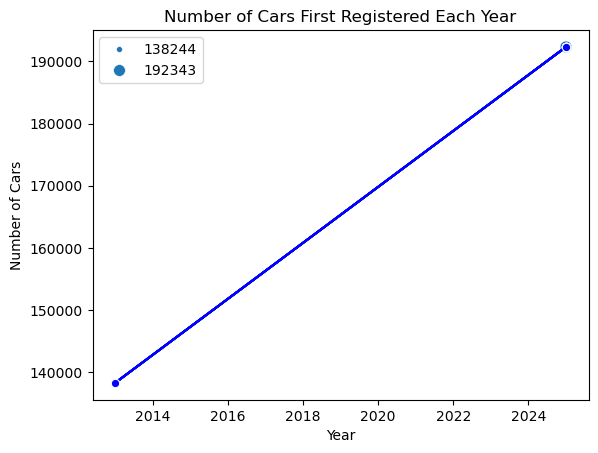

In [76]:
# trend of new cars 
sns.lineplot(x='YEAR', y='Car Count', marker='o', linestyle='-', color='b', data=car_count_by_year_df)
plt.title('Number of Cars First Registered Each Year')
plt.xlabel('Year')
plt.ylabel('Number of Cars')
plt.show()

Групуємо по роках і кольорах

In [77]:
top_colors_by_year = frsts.groupby('YEAR')['COLOR'].value_counts().reset_index(name='Count')

pivoted_colors_by_year = top_colors_by_year.pivot(index='COLOR', columns='YEAR', values='Count')
pivoted_colors_by_year

YEAR,2013,2025
COLOR,,
БІЛИЙ,29991,40375
БЕЖЕВИЙ,7487,2729
ЖОВТИЙ,882,455
ЗЕЛЕНИЙ,3525,3925
КОРИЧНЕВИЙ,6286,3542
ОРАНЖЕВИЙ,733,608
СІРИЙ,42478,66660
СИНІЙ,9908,20195
ФІОЛЕТОВИЙ,694,498


In [101]:
sorted_brands = pivoted_colors_by_year.sort_values(by=[2025, 2013], ascending=False)
sorted_brands

YEAR,2013,2025
COLOR,,
СІРИЙ,42478,66660
ЧОРНИЙ,25025,45025
БІЛИЙ,29991,40375
СИНІЙ,9908,20195
ЧЕРВОНИЙ,11235,8331
ЗЕЛЕНИЙ,3525,3925
КОРИЧНЕВИЙ,6286,3542
БЕЖЕВИЙ,7487,2729
ОРАНЖЕВИЙ,733,608


In [78]:
pivoted_colors_by_year.to_csv('colors_by_year.csv')

Бренди по рокам

In [79]:
frsts[frsts['YEAR']==2013][['BRAND', 'MODEL']].value_counts().head(10)

BRAND             MODEL   
HYUNDAI  ACCENT   ACCENT      3495
ЗАЗ  SENS         SENS        3186
KIA  RIO          RIO         2968
RENAULT  LOGAN    LOGAN       2584
ЗАЗ  VIDA         VIDA        2433
VOLKSWAGEN  POLO  POLO        2169
KIA  SPORTAGE     SPORTAGE    1973
ЗАЗ  LANOS        LANOS       1919
NISSAN  QASHQAI   QASHQAI     1911
FORD  FOCUS       FOCUS       1896
Name: count, dtype: int64

Чистим колонку Бренд в 2013 році, щоб була без моделі

In [80]:
frsts.loc[:,'brand_only'] = frsts['BRAND'].apply(lambda x: x.split()[0])

In [81]:
frsts['brand_only'].nunique()

167

In [82]:
frsts['brand_only'].value_counts().tail(10)

brand_only
FUQI       1
GEM        1
PROTON     1
HORH       1
XINKAI     1
TALBOT     1
HUABEI     1
FSO        1
ASIA       1
SANTANA    1
Name: count, dtype: int64

Ранжуємо топ-10 авто

In [86]:
brands_by_year = frsts.groupby('YEAR')['brand_only'].value_counts().reset_index(name='Count')

# Rank the brands within each year 
brands_by_year.loc[:,'rank'] = brands_by_year.groupby('YEAR')['Count'].rank(method='dense', ascending=False)

# Filter out the top 10 brands for each year
top_brands_df = brands_by_year[brands_by_year['rank'] <= 10]

# Sorting by year and rank for better readability
top_brands_df = top_brands_df.sort_values(by=['YEAR', 'rank'])

# Reset index for the final DataFrame
top_brands_df.reset_index(drop=True, inplace=True)

In [87]:
#same pivoting as with colors 
pivoted_brands_by_year = top_brands_df.pivot(index='brand_only', columns='YEAR', values='rank')

In [88]:
pivoted_brands_by_year

YEAR,2013,2025
brand_only,,
AUDI,NaN,2.0
BMW,NaN,5.0
FORD,10.0,9.0
GEELY,3.0,NaN
HYUNDAI,1.0,7.0
KIA,7.0,10.0
NISSAN,5.0,3.0
RENAULT,8.0,4.0
SKODA,NaN,8.0


In [91]:
pivoted_brands_by_year.to_csv('brands_by_year.csv')

In [93]:
#with counts instead of rating for vizualization
pivoted_brands_counts = top_brands_df.pivot(index='brand_only', columns='YEAR', values='Count')
pivoted_brands_counts.to_csv('pivoted_brands_counts.csv')
pivoted_brands_counts

YEAR,2013,2025
brand_only,,
AUDI,NaN,16667.0
BMW,NaN,11346.0
FORD,6422.0,9201.0
GEELY,9397.0,NaN
HYUNDAI,10960.0,10101.0
KIA,7975.0,7564.0
NISSAN,8419.0,13954.0
RENAULT,7649.0,11954.0
SKODA,NaN,9705.0


In [95]:
#unpivoted table for heatmap
top_brands_df.to_csv('top_brands_heatmap.csv')
top_brands_df

,YEAR,brand_only,Count,rank
0,2013,HYUNDAI,10960,1.0
1,2013,TOYOTA,10515,2.0
2,2013,GEELY,9397,3.0
3,2013,ЗАЗ,8502,4.0
4,2013,NISSAN,8419,5.0
5,2013,VOLKSWAGEN,8000,6.0
6,2013,KIA,7975,7.0
7,2013,RENAULT,7649,8.0
8,2013,ВАЗ,6438,9.0
9,2013,FORD,6422,10.0


Доля електромобілів

In [96]:
fuel_by_year = frsts.groupby(['YEAR', 'FUEL']).size().reset_index(name='Count')

pivoted_fuel_by_year = fuel_by_year.pivot(index='FUEL', columns='YEAR', values='Count')

pivoted_fuel_by_year['electro'] = pivoted_fuel_by_year.index.str.contains('ЕЛЕКТРО')
electro = pivoted_fuel_by_year.groupby('electro').sum()
electro = electro.T
electro

electro,False,True
YEAR,,
2013,138061.0,83.0
2025,132092.0,60249.0


<BarContainer object of 2 artists>

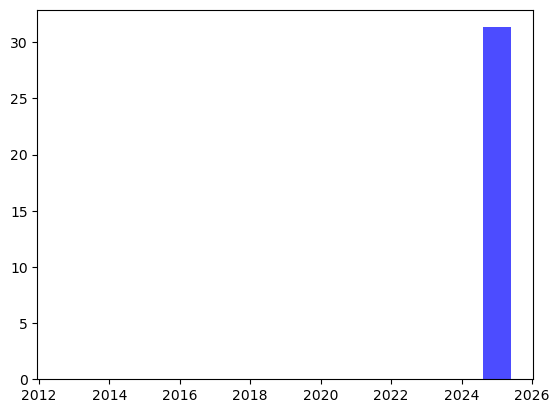

In [97]:
electro['year_total'] = electro[True] + electro[False]
electro['share_true'] = electro[True] / electro['year_total']
plt.bar(electro.index, electro['share_true'] * 100, color='blue', alpha=0.7)

Візуалізація на flourish  
https://public.flourish.studio/story/3335095/